Validación de los experimentos

instalación de librerías necesarias. Se tiene diferentes recursos en GCP por eso se instala el cliente de Storage para descargar fácilmente esa información

In [ ]:
%pip install google-cloud-storage
%pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 27.2 MB/s eta 0:00:00


Descargar el Dataset del Bucket en GCP usando la cuenta de servicio en llave.json

In [ ]:
%mkdir /content/sample_data/dataset

In [ ]:
from google.cloud import storage

# Set the path to your service account key file
import os
os.environ['GOOGLE_APPLICATION_CREDENTIALS'] = '/content/llave.json'

# Initialize a storage client
storage_client = storage.Client()

# Define the bucket name and the source prefix (folder) in the bucket
bucket_name = 'vision-scooter-raw'
file_name = 'yolo_dataset3.zip'

# Define the destination directory on your local machine
destination_directory = '/content/dataset.zip'


# Get the bucket
bucket = storage_client.bucket(bucket_name)
blob = bucket.blob(file_name)

# Download the file to the local machine
blob.download_to_filename(destination_directory)

# file_name = ['experimento4_20250902_235826.zip', "experimento1_20250901_005021.zip", "experimento2_20250901_054028.zip", "experimento5_20250906_021333.zip"]
file_name = ["experimento5_20250906_021333.zip"]


for file in file_name:
  print(file)
# Define the destination directory on your local machine
  destination_directory = f'/content/{file}.zip'
  # Get the bucket
  bucket = storage_client.bucket(bucket_name)
  blob = bucket.blob(file)

  # Download the file to the local machine
  blob.download_to_filename(destination_directory)




print("Download complete.")

experimento5_20250906_021333.zip
Download complete.


In [ ]:
Descomprimir el datset para poderlo usar

In [ ]:
!unzip dataset.zip -d /content/
# !unzip experimento1_20250901_005021.zip -d /content/experimento1_20250901_005021
# !unzip experimento2_20250901_054028.zip -d /content/experimento2_20250901_054028
# !unzip experimento4_20250902_235826.zip -d /content/experimento4_20250902_235826
!unzip experimento5_20250906_021333.zip -d /content/experimento5_20250906_021333


Se truncaron las últimas líneas 5000 del resultado de transmisión.
  inflating: /content/dataset3/images/train/a915f999-af81-42c2-9f26-87d5d8ff5fa2.jpg  
  inflating: /content/dataset3/images/train/c5f34fed-28f5-4d94-8c9f-f1c46ae9f518.jpg  
  inflating: /content/dataset3/images/train/8accf32a-5244-4f02-a356-89a57eedfa8e.jpg  
  inflating: /content/dataset3/images/train/22b8de42-c2c6-4017-8be0-7db681084440.jpg  
  inflating: /content/dataset3/images/train/e7c93c18-80f8-4187-9c87-e96b8bbaa9b9.jpg  
  inflating: /content/dataset3/images/train/27b3412a-3474-484a-ada3-fe735d266b00.jpg  
  inflating: /content/dataset3/images/train/16392116-63f2-4a8a-a00f-8d3a9fac33f0.jpg  
  inflating: /content/dataset3/images/train/e5c8c20a-7ea0-418b-9e18-1dd1ef8aa166.jpg  
  inflating: /content/dataset3/images/train/9829669b-7d79-4fc5-927a-5cae78bc1c3f.jpg  
  inflating: /content/dataset3/images/train/47c4fc99-5977-4e05-9a0a-522528ac1af1.jpg  
  inflating: /content/dataset3/images/train/c26f4941-9191-4f21-

In [ ]:
!mv /content/dataset3 /content/dataset


In [ ]:
Creación de dataset.yaml para indicarle a YOLO donde y como se compone el conjunto de datos para la validacion

In [ ]:
yaml_content = """path: /content/dataset # dataset root dir
train: images/train
val: images/val
test: images/test

# Classes
names:
  0: Faciles
  1: Otras
"""

with open('/content/dataset/dataset.yaml', 'w') as f:
    f.write(yaml_content)

print("Created /content/dataset/dataset.yaml")

Created /content/dataset/dataset.yaml


In [ ]:
! rm -r /content/faciles_sgg*

Revisión de algunas predicciones del conjunto de datos de validación

In [ ]:
from ultralytics import YOLO
model = YOLO('/content/experimento5_20250906_021333/weights/best.pt')


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.



image 1/1 /content/dataset/images/val/fe7bfc22-a3b2-43c5-8488-2e23e79b5b86.jpg: 512x640 1 Faciles, 81.6ms
Speed: 3.2ms preprocess, 81.6ms inference, 2.1ms postprocess per image at shape (1, 3, 512, 640)
['0']
------ [{'name': 'Faciles', 'class': 0, 'confidence': 0.97187, 'box': {'x1': 104.3019, 'y1': 0.0, 'x2': 710.47632, 'y2': 560.98108}, 'segments': {'x': [342.984375, 342.984375, 344.25, 344.25, 345.515625, 345.515625, 350.578125, 351.84375, 353.109375, 354.375, 355.640625, 358.171875, 359.4375305175781, 361.96875, 363.234375, 368.296875, 369.5624694824219, 374.625, 375.890625, 380.953125, 382.21875, 387.28125, 388.546875, 392.34375, 394.875, 396.140625, 412.59375, 412.59375, 415.125, 415.125, 416.390625, 416.390625, 417.65625, 417.65625, 416.390625, 416.390625, 412.59375, 411.328125, 408.796875, 407.53125, 405.0, 403.734375, 397.40625, 396.140625, 392.34375, 391.078125, 389.8124694824219, 386.015625, 384.75, 379.6875305175781, 378.421875, 372.09375, 370.828125, 365.765625, 364.5, 3

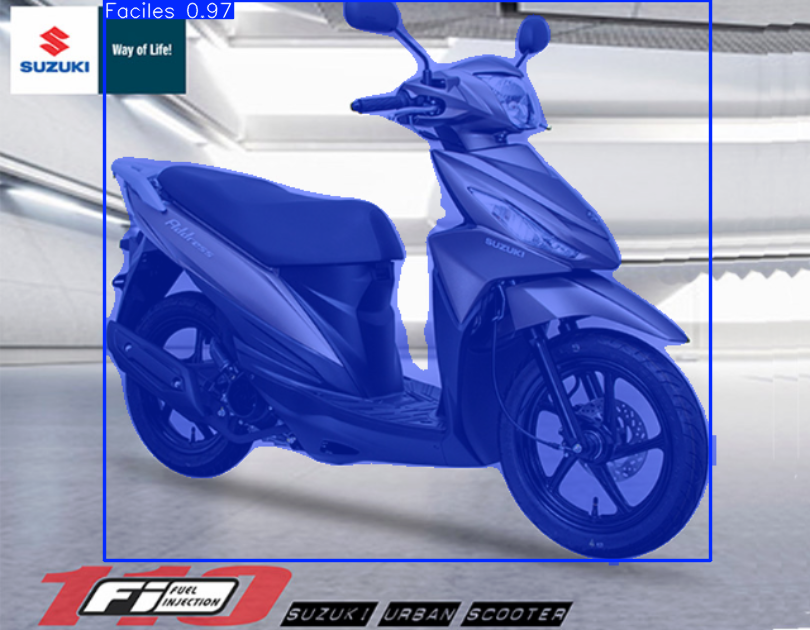

1 Faciles, 
0 0.97187


In [ ]:
# results = model("https://http2.mlstatic.com/D_NQ_NP_981275-MCO91439800701_092025-O.webp")
results = model("/content/dataset/images/val/fe7bfc22-a3b2-43c5-8488-2e23e79b5b86.jpg"
, iou=0.7, verbose = True, agnostic_nms=True)
predicted_classes = [str(result.summary()[0]["class"]) for result in results]
print(predicted_classes)
for result in results:
    print("------",result.summary())
    print(len(result.summary()))
    result.show()
    print(result.verbose())
    for r in result.summary():
      print(r["class"], r["confidence"])

------ [{'name': 'Faciles', 'class': 0, 'confidence': 0.9105, 'box': {'x1': 9.31469, 'y1': 23.86698, 'x2': 935.73706, 'y2': 652.22498}, 'segments': {'x': [324.7421875, 324.7421875, 323.203125, 323.203125, 321.6640625, 321.6640625, 320.125, 320.125, 318.5859375, 318.5859375, 315.5078125, 306.2734375, 304.734375, 297.0390625, 295.5, 292.421875, 290.8828125, 289.34375, 284.7265625, 284.7265625, 283.1875, 283.1875, 284.7265625, 284.7265625, 286.265625, 286.265625, 287.8046875, 287.8046875, 286.265625, 286.265625, 281.6484375, 280.109375, 277.03125, 277.03125, 270.875, 270.875, 257.0234375, 257.0234375, 246.25, 246.25, 243.171875, 243.171875, 241.6328125, 241.6328125, 240.09376525878906, 240.09376525878906, 238.5546875, 238.5546875, 237.015625, 237.015625, 235.4765625, 235.4765625, 233.9375, 233.9375, 224.703125, 223.1640625, 220.0859375, 218.546875, 215.46876525878906, 213.9296875, 209.3125, 207.7734375, 200.078125, 198.5390625, 189.3046875, 187.765625, 181.609375, 180.0703125, 172.375, 17

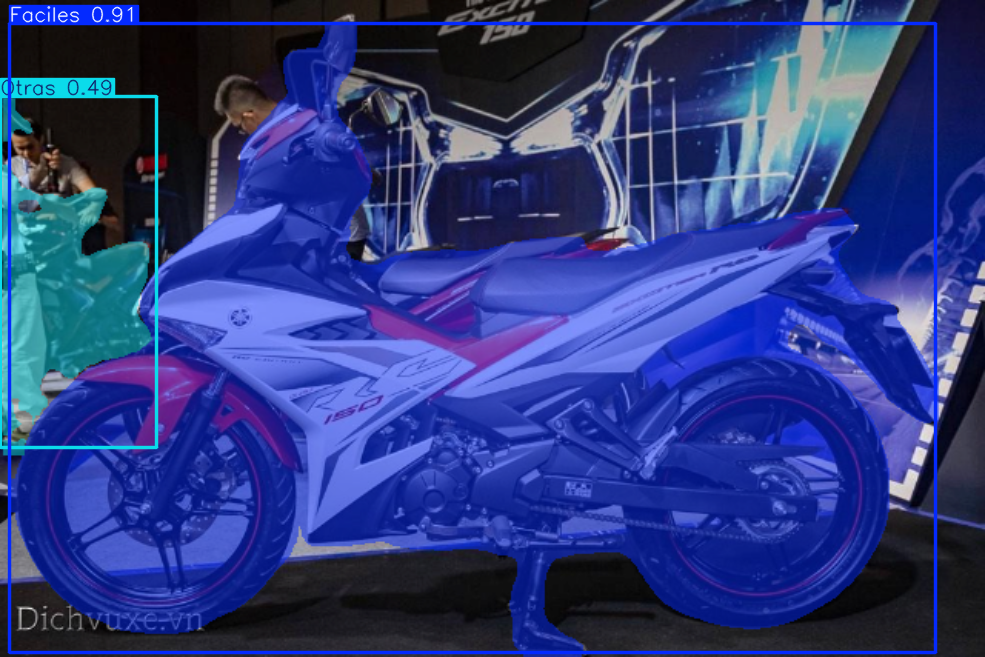

1 Faciles, 1 Otras, 
0 0.9105
1 0.48563


In [ ]:
for result in results:
    print("------",result.summary())
    print(len(result.summary()))
    result.show()
    print(result.verbose())
    for r in result.summary():
      print(r["class"], r["confidence"])

All entries in the directory: 648
deteccion mal en /content/dataset/images/val/1d72278a-7e5f-4897-b6f6-70b1bba3e52f.jpg


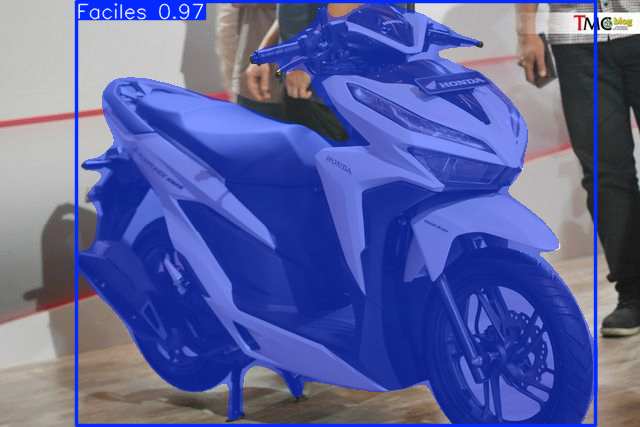

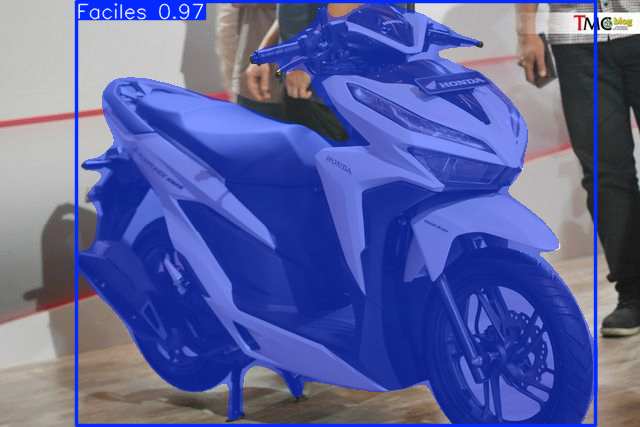

deteccion mal en /content/dataset/images/val/988d6487-9f8c-4579-96b0-40a371c483d4.jpg


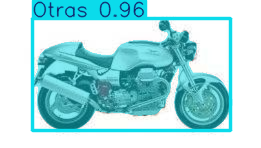

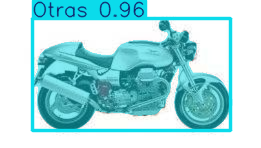

deteccion mal en /content/dataset/images/val/d394fb54-db3e-4b5e-a20e-c8855c6b51c0.jpg


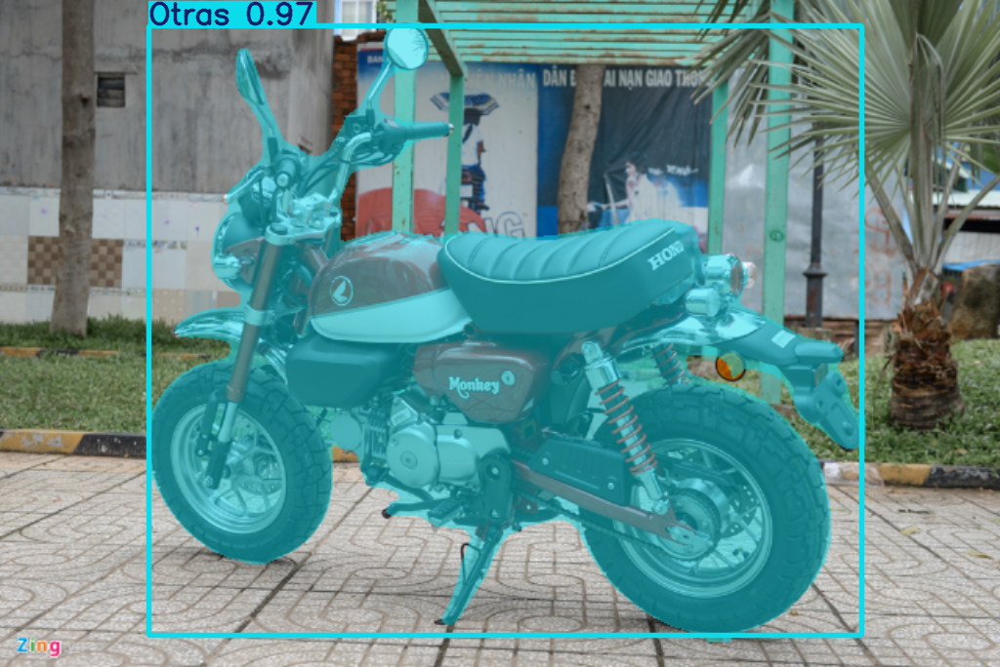

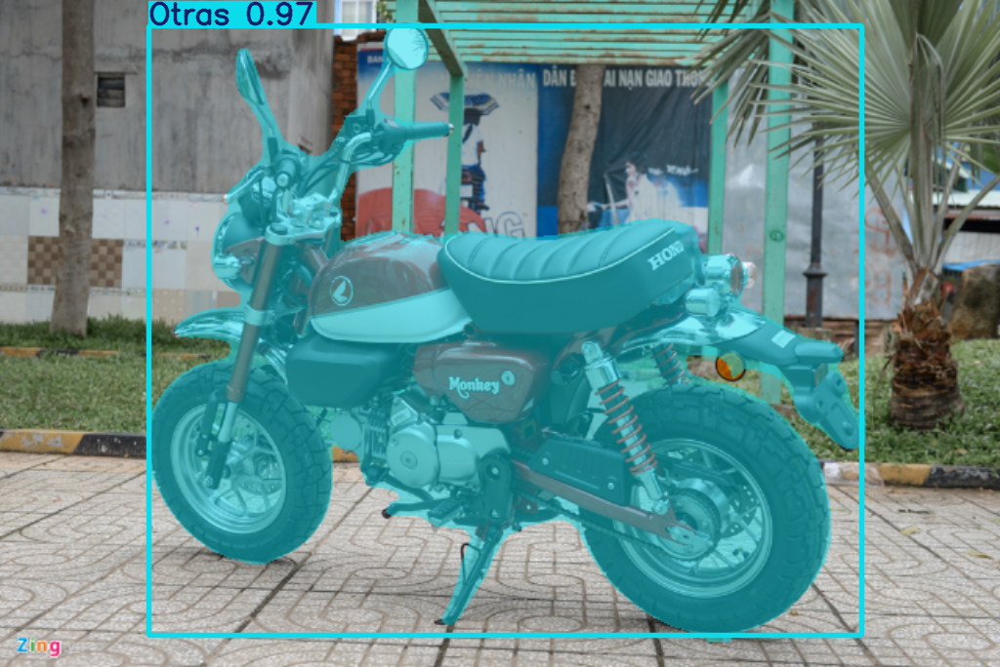

deteccion mal en /content/dataset/images/val/56df84f1-e203-44d0-abc6-55ad89059ac4.jpg


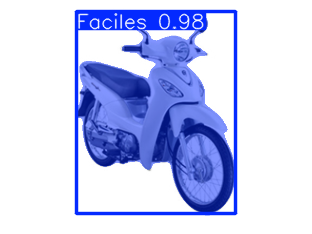

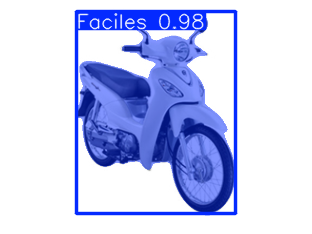

deteccion mal en /content/dataset/images/val/6717a6ab-0025-4568-8b82-b521037bb9ba.jpg


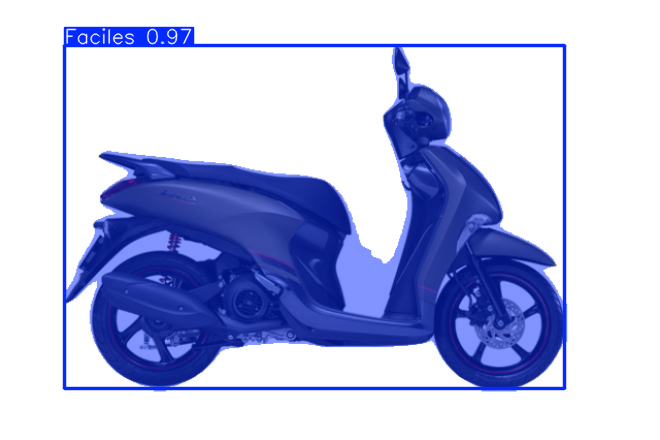

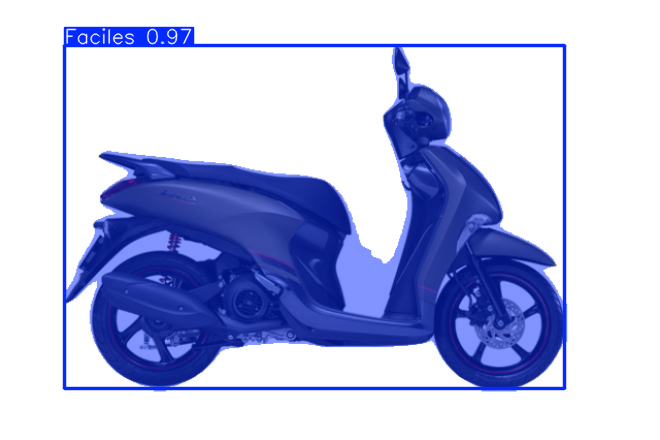

deteccion mal en /content/dataset/images/val/45e77e11-b469-4c51-bae3-9066ac90bd1b.jpg


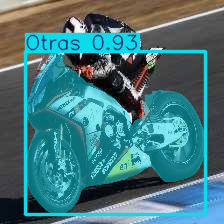

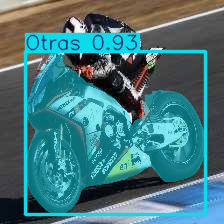

deteccion mal en /content/dataset/images/val/e805f0d1-4557-48bc-b530-4df622bda2c8.jpg


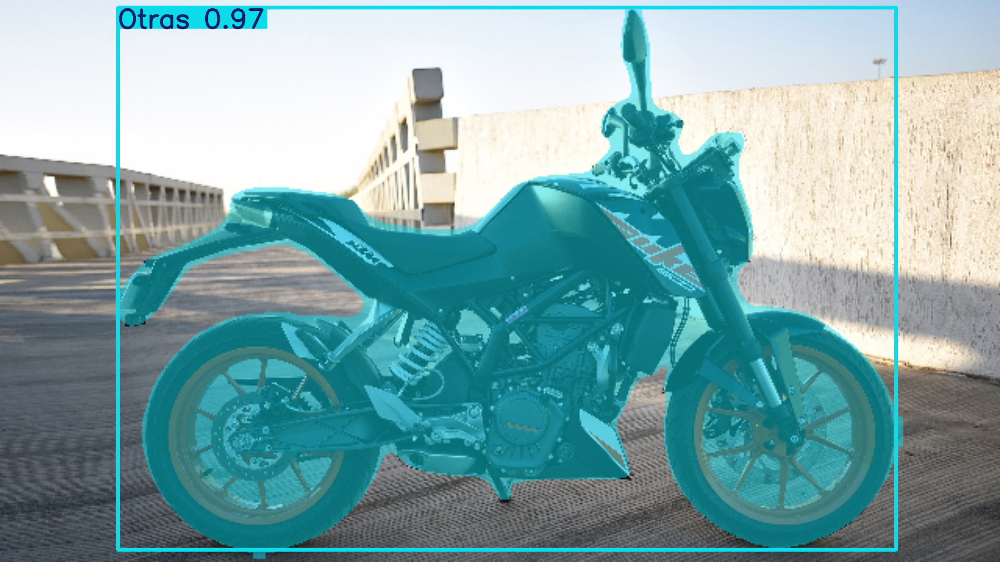

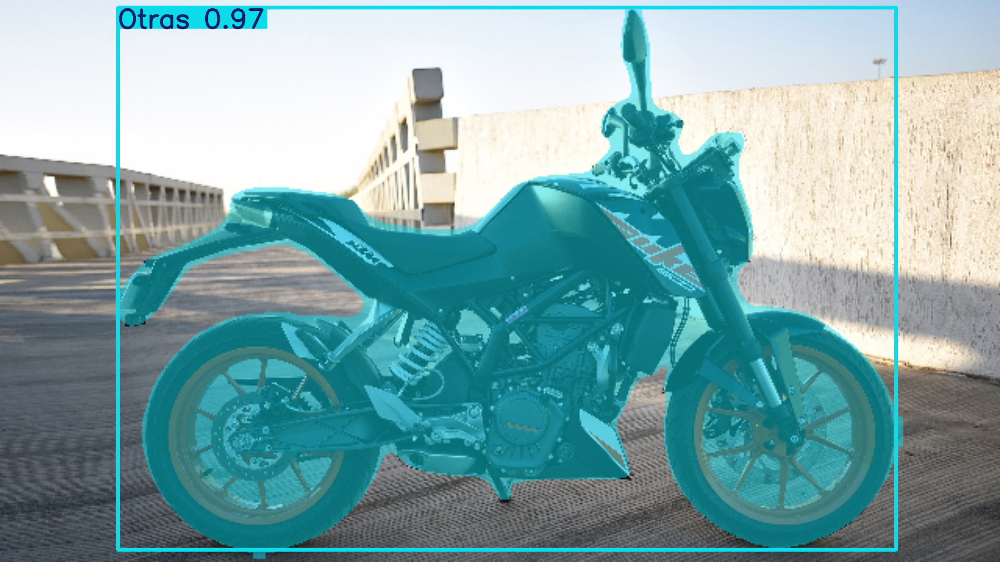

deteccion mal en /content/dataset/images/val/5e130401-263c-4734-acda-5b170c278cb8.jpg


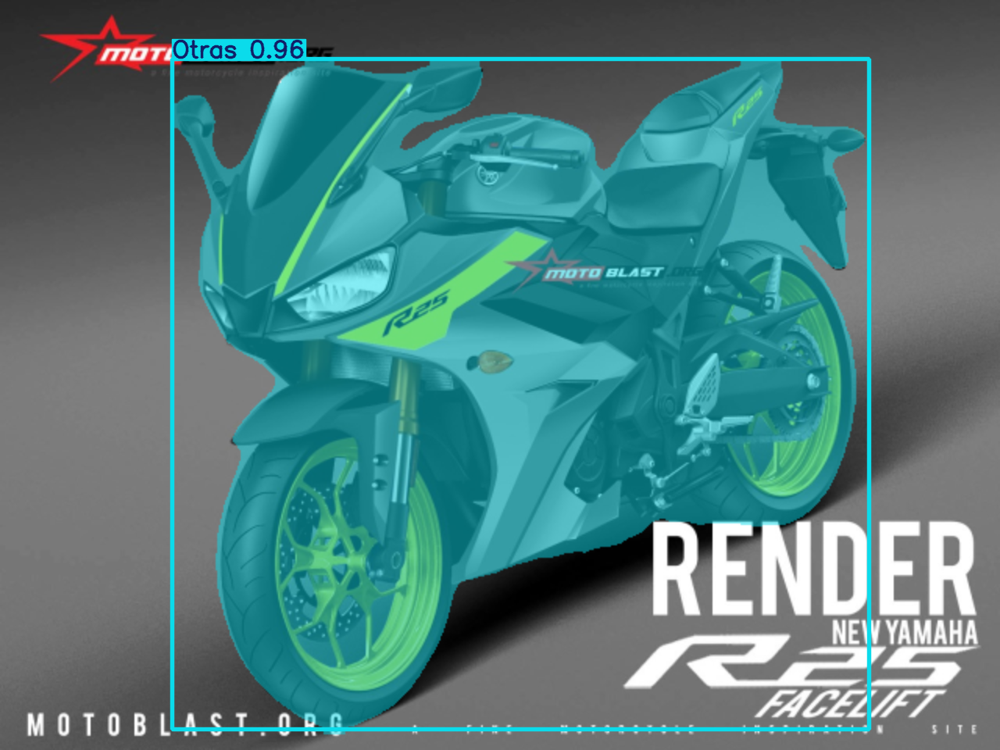

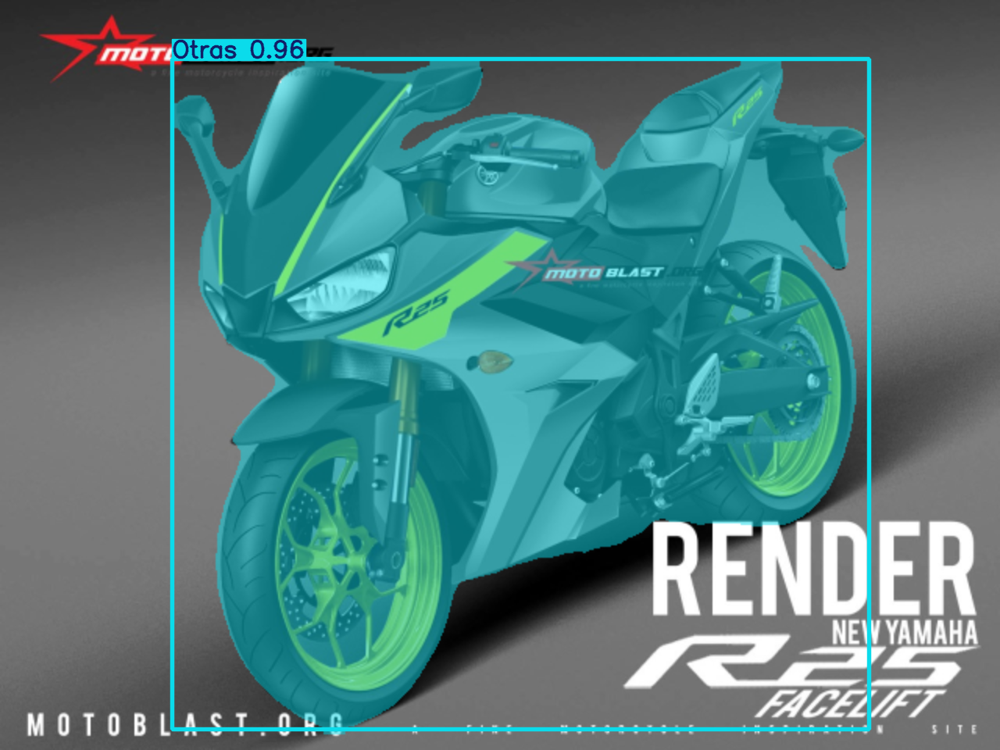

deteccion mal en /content/dataset/images/val/3b09cc9f-e72b-4282-ba02-e7721da01d58.jpg


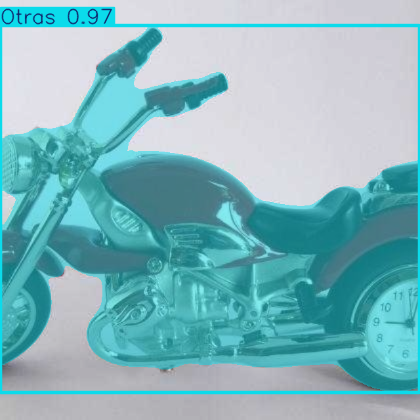

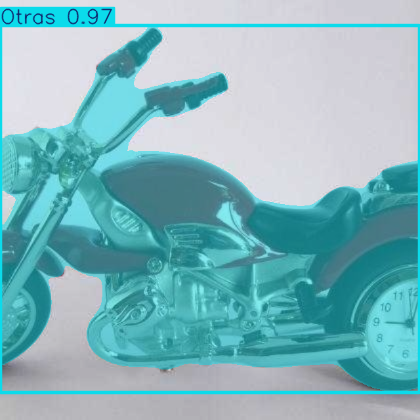

deteccion mal en /content/dataset/images/val/88546b50-4de9-4c68-907a-33dce1b657bf.jpg


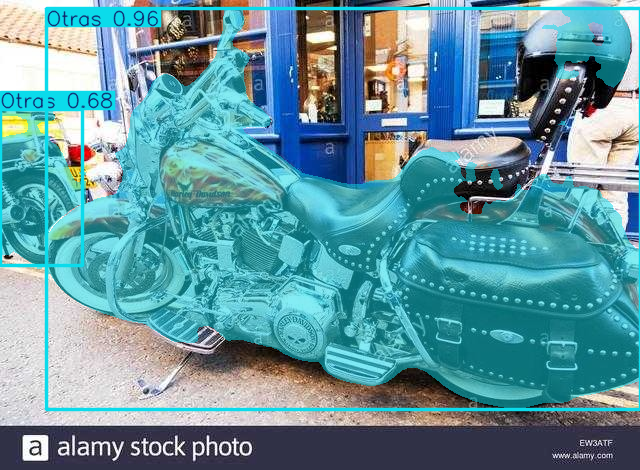

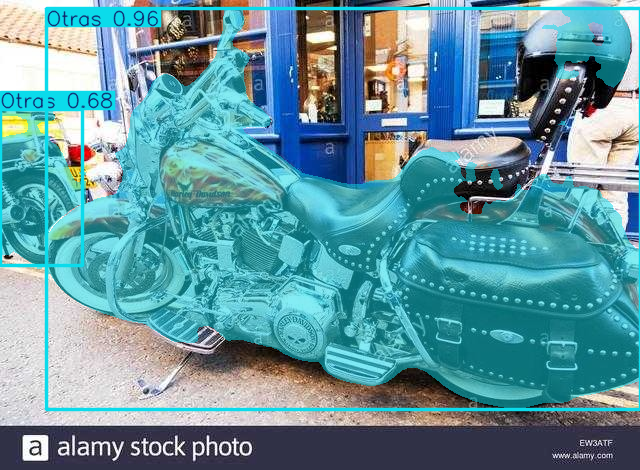

final
['/content/dataset/images/val/1d72278a-7e5f-4897-b6f6-70b1bba3e52f.jpg', '/content/dataset/images/val/988d6487-9f8c-4579-96b0-40a371c483d4.jpg', '/content/dataset/images/val/d394fb54-db3e-4b5e-a20e-c8855c6b51c0.jpg', '/content/dataset/images/val/56df84f1-e203-44d0-abc6-55ad89059ac4.jpg', '/content/dataset/images/val/6717a6ab-0025-4568-8b82-b521037bb9ba.jpg', '/content/dataset/images/val/45e77e11-b469-4c51-bae3-9066ac90bd1b.jpg', '/content/dataset/images/val/e805f0d1-4557-48bc-b530-4df622bda2c8.jpg', '/content/dataset/images/val/5e130401-263c-4734-acda-5b170c278cb8.jpg', '/content/dataset/images/val/3b09cc9f-e72b-4282-ba02-e7721da01d58.jpg', '/content/dataset/images/val/88546b50-4de9-4c68-907a-33dce1b657bf.jpg']
10


In [ ]:
import os
import random

# directory_path = ["/content/dataset/images/val", "/content/dataset/images/test","/content/dataset/images/train"]  # Replace with the actual path
directory_path = ["/content/dataset/images/val"]  # Replace with the actual path
all_entries = []
for folder in directory_path:
    all_entries.extend([f"{folder}/{path}" for path in os.listdir(folder)])
image_folder = "/content/dataset/images/val"
# label_folder = "/content/dataset/labels/val"

print("All entries in the directory:", len(all_entries))
bad = []

for _ in range(10):
# for entry in all_entries:
    entry = random.choice(all_entries)
    try:
        # print(entry)
        # label_file = f'{entry.split(".")[0]}.txt'
        # label_path = label_file.replace("/images/", "/labels/")
        image_path = entry
        # predicçted_classes = []
        # with open(label_path )as f:
            # true_class = f.read(1)
        results = model([image_path], verbose = False, agnostic_nms=True)
        # print(results
        for result in results:
          try:
            predicted_classes.append(str(result.summary()[0]["class"]))
          except:
            print("deteccion mal en", image_path)
            bad.append(image_path)
            result.show()
            continue

        # predicted_classes = [str(result.summary()[0]["class"]) for result in results]

        # print(predicted_classes, true_class, [predicted == true_class for predicted in predicted_classes])

        # if len(predicted_classes) == 0 or not all(predicted == true_class for predicted in predicted_classes):
            # print("deteccion mal en", image_path, f"Salio {str(predicted_classes)} y debia ser {true_class}")
            # bad.append(image_path)
        results[0].show()
    except:
        print("---- Algo salio mal en ", image_path)
        bad.append(image_path)
        # pass



print("final")
print(bad)
print(len(bad))

Evaluación del modelo exploratorio con YOLO8

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('/content/experimento1_20250901_005021/weights/best.pt')
metrics = model.val(data="/content/dataset/dataset.yaml", agnostic_nms = True, save_json=True, visualize=True)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.195 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8x-seg summary (fused): 125 layers, 71,722,582 parameters, 0 gradients, 327.9 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1521.9±740.0 MB/s, size: 81.0 KB)
val: Scanning /content/dataset/labels/val... 647 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 647/647 816.0it/s 0.8s
val: New cache created: /content/dataset/labels/val.cache
requirements: Ultralytics requirement ['faster-coco-eval>=1.6.7'] not found, attempting AutoUpdate...

requirements: AutoUpdate success ✅ 1.4s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect

WARNING ⚠️ Limiting v

Experimento Yolo 11


In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('/content/experimento2_20250901_054028/weights/best.pt')
metrics = model.val(data="/content/dataset/dataset.yaml", agnostic_nms = True, save_json=True, visualize=True)

Ultralytics 8.3.195 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO11x-seg summary (fused): 203 layers, 62,004,438 parameters, 0 gradients, 295.9 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 82.3±137.7 MB/s, size: 19.9 KB)
val: Scanning /content/dataset/labels/val.cache... 647 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 647/647 985.7Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 41/41 0.5it/s 1:26
                   all        647        692      0.965      0.954      0.973      0.938      0.965      0.954      0.972      0.895
               Faciles        311        343      0.964      0.942      0.971      0.941      0.964      0.942      0.971      0.894
                 Otras        336        349      0.965      0.966      0.974      0.934      0.965      0.966      0.974      0.895
Speed: 0.6ms preprocess, 58.2ms inference, 0

Validación de los experimentos finales

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('/content/experimento4_20250902_235826/weights/best.pt')
metrics = model.val(data="/content/dataset/dataset.yaml", agnostic_nms = True, save_json=True, visualize=True)

Ultralytics 8.3.195 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO11x-seg summary (fused): 203 layers, 62,004,438 parameters, 0 gradients, 295.9 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1127.1±673.2 MB/s, size: 43.4 KB)
val: Scanning /content/dataset/labels/val.cache... 647 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 647/647 739.8Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 41/41 0.5it/s 1:28
                   all        647        692      0.962      0.952      0.973      0.937      0.963      0.954      0.973      0.899
               Faciles        311        343      0.956      0.933      0.969      0.935      0.959      0.936      0.971      0.899
                 Otras        336        349      0.967      0.971      0.976      0.939      0.967      0.971      0.976      0.899
Speed: 0.5ms preprocess, 60.7ms inference,

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('/content/experimento5_20250906_021333/weights/best.pt')
metrics = model.val(data="/content/dataset/dataset.yaml", agnostic_nms = True, save_json=True, visualize=True)

Ultralytics 8.3.195 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO11x-seg summary (fused): 203 layers, 62,004,438 parameters, 0 gradients, 295.9 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2077.9±1247.9 MB/s, size: 178.8 KB)
val: Scanning /content/dataset/labels/val... 647 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 647/647 1.2Kit/s 0.5s
val: New cache created: /content/dataset/labels/val.cache
requirements: Ultralytics requirement ['faster-coco-eval>=1.6.7'] not found, attempting AutoUpdate...

requirements: AutoUpdate success ✅ 0.7s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 41/41 0.5it/s 1:24
                   all        647        692      0.955      0.959       0.97       0.94      0.955      0.959      0.969      0.904
               Faciles     